In [5]:

import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab

import random
import string

#import cv2
import os
from pickle import dump, load
import json

import nltk
nltk.download("stopwords")
from nltk.corpus import stopwords

import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Embedding, LSTM, Dense, Bidirectional, Input, Dropout, Attention
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.xception import Xception, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

#from keras.layers.merge import add

from tensorflow.keras.models import Model, load_model

# small library for seeing the progress of loops.
from tqdm.notebook import tqdm

pylab.rcParams['figure.figsize'] = (8.0, 10.0)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
from pycocotools.coco import COCO

In [7]:
annotation_file = "C:/Users/user/Downloads/annotations_trainval2017/annotations/instances_train2017.json"

# Initialize COCO api for instance annotations
coco = COCO(annotation_file)



loading annotations into memory...
Done (t=271.26s)
creating index...
index created!


In [8]:
# Get all categories
cats = coco.loadCats(coco.getCatIds())

maincategories = list(set([cat['supercategory'] for cat in cats]))

print("Number of main categories: ", len(maincategories))
print("List of main categories: ", maincategories)

Number of main categories:  12
List of main categories:  ['food', 'vehicle', 'animal', 'sports', 'furniture', 'accessory', 'outdoor', 'indoor', 'kitchen', 'appliance', 'electronic', 'person']


In [9]:
subcategories = [cat['name'] for cat in cats]

print("Number of sub categories: ", len(subcategories))
print("List of sub categories: ", subcategories)

Number of sub categories:  80
List of sub categories:  ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


In [10]:
catIds = coco.getCatIds(catNms=subcategories)

subcategories_Ids = dict()
for i in range(0,len(subcategories)):
    subcategories_Ids[subcategories[i]] = catIds[i]

print("Sub categories with IDs :",subcategories_Ids)

Sub categories with IDs : {'person': 1, 'bicycle': 2, 'car': 3, 'motorcycle': 4, 'airplane': 5, 'bus': 6, 'train': 7, 'truck': 8, 'boat': 9, 'traffic light': 10, 'fire hydrant': 11, 'stop sign': 13, 'parking meter': 14, 'bench': 15, 'bird': 16, 'cat': 17, 'dog': 18, 'horse': 19, 'sheep': 20, 'cow': 21, 'elephant': 22, 'bear': 23, 'zebra': 24, 'giraffe': 25, 'backpack': 27, 'umbrella': 28, 'handbag': 31, 'tie': 32, 'suitcase': 33, 'frisbee': 34, 'skis': 35, 'snowboard': 36, 'sports ball': 37, 'kite': 38, 'baseball bat': 39, 'baseball glove': 40, 'skateboard': 41, 'surfboard': 42, 'tennis racket': 43, 'bottle': 44, 'wine glass': 46, 'cup': 47, 'fork': 48, 'knife': 49, 'spoon': 50, 'bowl': 51, 'banana': 52, 'apple': 53, 'sandwich': 54, 'orange': 55, 'broccoli': 56, 'carrot': 57, 'hot dog': 58, 'pizza': 59, 'donut': 60, 'cake': 61, 'chair': 62, 'couch': 63, 'potted plant': 64, 'bed': 65, 'dining table': 67, 'toilet': 70, 'tv': 72, 'laptop': 73, 'mouse': 74, 'remote': 75, 'keyboard': 76, 'c

In [11]:
subcategories_imageIds = dict()

for i in range(0,len(catIds)):
    imgIds = coco.getImgIds(catIds=catIds[i])
    img = []
    for j in imgIds:
        img.append(j)
    subcategories_imageIds[subcategories[i]] = img


In [12]:
length_dict = {key: len(value) for key, value in subcategories_imageIds.items()}
print("Total images in each sub categories: ", length_dict)

Total images in each sub categories:  {'person': 64115, 'bicycle': 3252, 'car': 12251, 'motorcycle': 3502, 'airplane': 2986, 'bus': 3952, 'train': 3588, 'truck': 6127, 'boat': 3025, 'traffic light': 4139, 'fire hydrant': 1711, 'stop sign': 1734, 'parking meter': 705, 'bench': 5570, 'bird': 3237, 'cat': 4114, 'dog': 4385, 'horse': 2941, 'sheep': 1529, 'cow': 1968, 'elephant': 2143, 'bear': 960, 'zebra': 1916, 'giraffe': 2546, 'backpack': 5528, 'umbrella': 3968, 'handbag': 6841, 'tie': 3810, 'suitcase': 2402, 'frisbee': 2184, 'skis': 3082, 'snowboard': 1654, 'sports ball': 4262, 'kite': 2261, 'baseball bat': 2506, 'baseball glove': 2629, 'skateboard': 3476, 'surfboard': 3486, 'tennis racket': 3394, 'bottle': 8501, 'wine glass': 2533, 'cup': 9189, 'fork': 3555, 'knife': 4326, 'spoon': 3529, 'bowl': 7111, 'banana': 2243, 'apple': 1586, 'sandwich': 2365, 'orange': 1699, 'broccoli': 1939, 'carrot': 1683, 'hot dog': 1222, 'pizza': 3166, 'donut': 1523, 'cake': 2925, 'chair': 12774, 'couch': 44

In [13]:
train_cats = subcategories_imageIds['elephant'] + subcategories_imageIds['sandwich']
imgIdss = coco.getImgIds(imgIds = train_cats)
print("Total Images: ", len(imgIdss))

Total Images:  4508


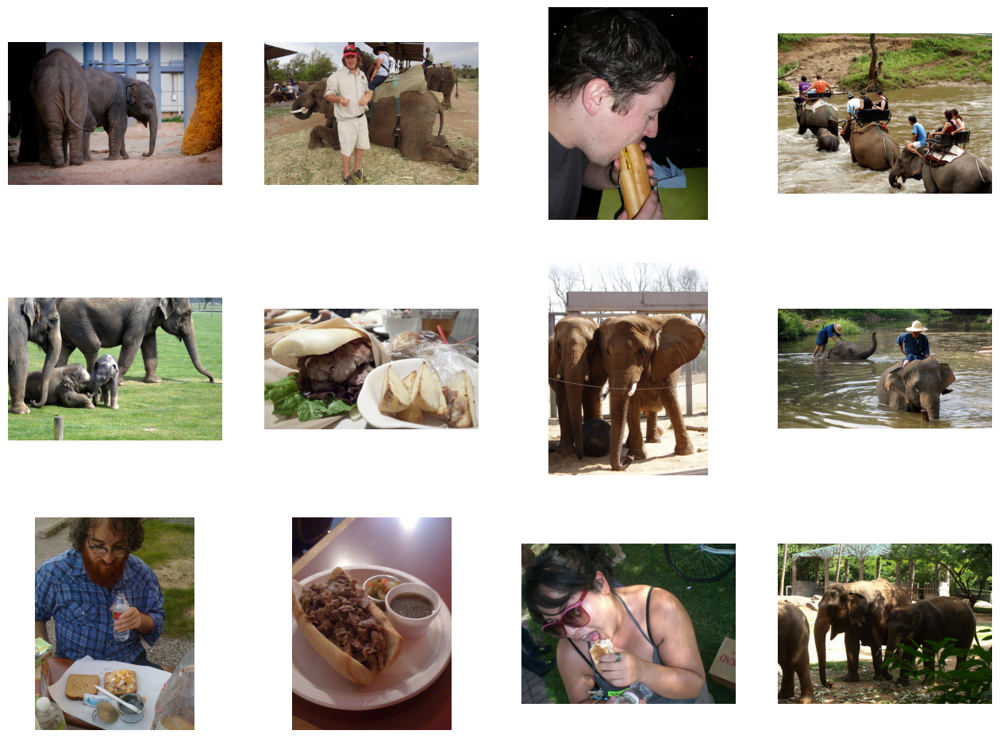

In [14]:
fig = plt.gcf()
fig.set_size_inches(16, 16)

next_pix = imgIdss
random.shuffle(next_pix)

for i, img_path in enumerate(next_pix[0:12]):

    sp = plt.subplot(4, 4, i + 1)
    sp.axis('Off')

    img = coco.loadImgs(img_path)[0]
    I = io.imread(img['coco_url'])
    plt.imshow(I)

plt.show()

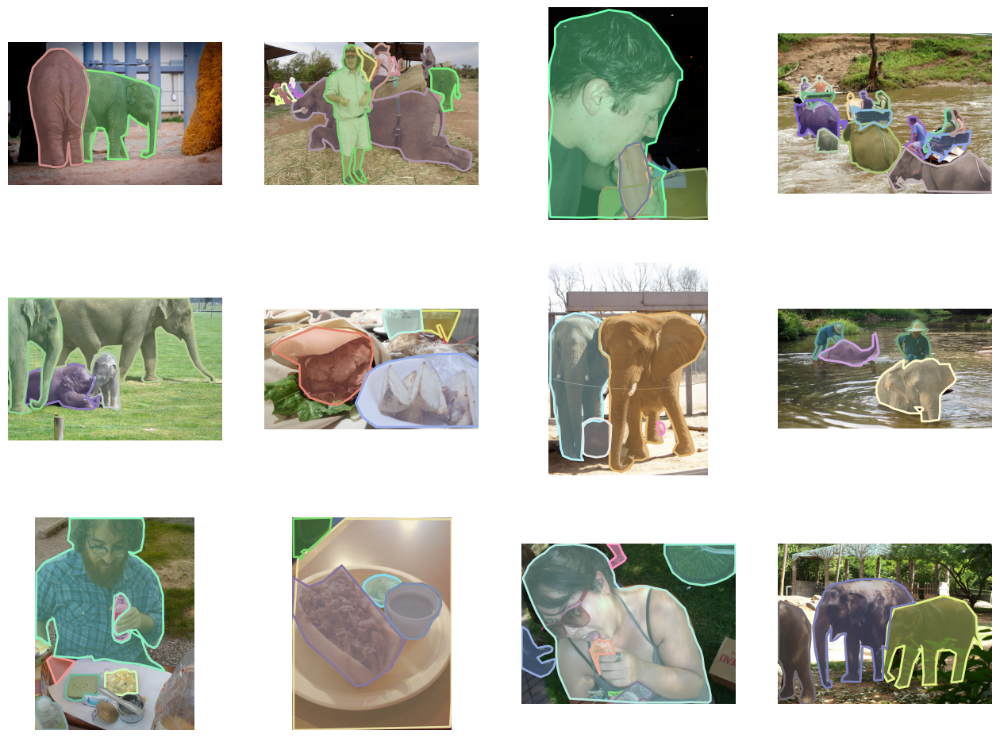

In [15]:
fig = plt.gcf()
fig.set_size_inches(16, 16)

for i, img_path in enumerate(next_pix[0:12]):

    sp = plt.subplot(4, 4, i + 1)
    sp.axis('Off')

    img = coco.loadImgs(img_path)[0]
    I = io.imread(img['coco_url'])
    plt.imshow(I)
    annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
    anns = coco.loadAnns(annIds)
    # print(anns)
    
    coco.showAnns(anns)


plt.show()

In [18]:
annFile = "C:/Users/user/Downloads/annotations_trainval2017/annotations/captions_train2017.json"
coco_caps=COCO(annFile)

loading annotations into memory...
Done (t=1.26s)
creating index...
index created!


A couple of elephants standing next to each other.
The two young elephants are standing beside a huge adult. 
Two baby elephants standing in an enclosure at a zoo.
Two small elephants standing near each other in the dirt.
Elephants are standing in an outdoor zoo exhibit.


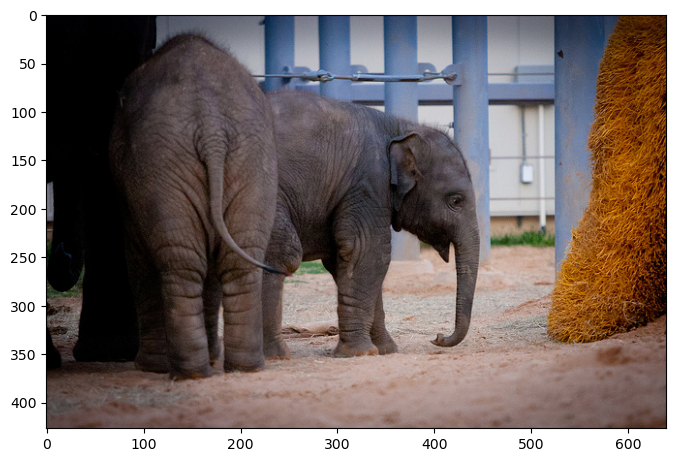

In [19]:
img = coco.loadImgs(next_pix[0])[0]
I = io.imread(img['coco_url'])
plt.imshow(I)
annIds = coco_caps.getAnnIds(imgIds=img['id']);
anns = coco_caps.loadAnns(annIds)
coco_caps.showAnns(anns)
plt.show()

A line of people riding elephants are fording a river
Groups on elephants crossing river with mud and grass nearby
PEOPLE RIDING ON ELEPHANTS ACROSS A BODY OF WATER.
Elephants carrying people to cross a deep river
People crossing the river on the backs of elephants


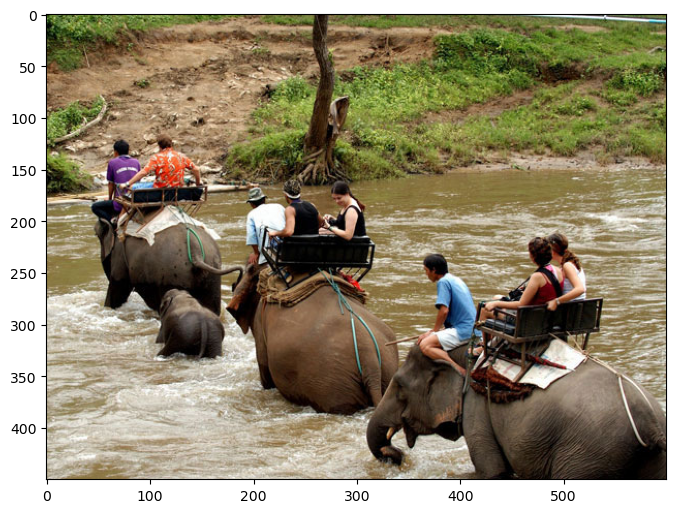

In [20]:
img = coco.loadImgs(next_pix[3])[0]
I = io.imread(img['coco_url'])
plt.imshow(I)
annIds = coco_caps.getAnnIds(imgIds=img['id']);
anns = coco_caps.loadAnns(annIds)
coco_caps.showAnns(anns)
plt.show()

In [21]:
#image caption generator. 
#starting the NLP part in the caption

# Preparing our dataset

In [22]:
#Print Total Images for Training:
print("Total images for training: ", len(imgIdss))


Total images for training:  4508


In [23]:
#nitializes a dictionary to store captions for each image URL and a list to temporarily hold captions for individual images.
dataset = dict()
imgcaptions = []



#Iterate Over Image IDs:
#For each image ID in the list imgIdss, it loads the image data using coco.loadImgs.
#Retrieves annotation IDs (annIds) for the captions of the image using coco_caps.getAnnIds.
#Loads the annotations (anns), which contain the captions.
for imgid in imgIdss:
    img = coco.loadImgs(imgid)[0]
    annIds = coco_caps.getAnnIds(imgIds=img['id']);
    anns = coco_caps.loadAnns(annIds)
    imgcaptions = []
    for cap in anns:
        
        # Remove punctuation
        cap = cap['caption'].translate(str.maketrans('', '', string.punctuation))
        
        # Replace - to blank
        cap = cap.replace("-"," ")
        
        # Split string into word list and Convert each word into lower case
        cap = cap.split()
        cap = [word.lower() for word in cap]
        
        # join word list into sentence and <start> and <end> tag to each sentence which helps 
        # LSTM encoder-decoder model while training.
        
        cap = '<start> ' + " ".join(cap) + ' <end>'
        imgcaptions.append(cap)

#Store Processed Captions:
        
    dataset[img['coco_url']] = imgcaptions 
    
    
print("Length of Dataset: ",len(dataset))
print(dataset['http://images.cocodataset.org/train2017/000000312789.jpg'])

Length of Dataset:  4508
['<start> a sandwich sitting on top of a white plate <end>', '<start> a sandwich that is on a white plate <end>', '<start> a sandwich on seeded bread with melted cheese <end>', '<start> part of a sandwich on a plate with a plastic cap laying next to it <end>', '<start> a hot sandwich on a sesame seed bun <end>']


# Preprocess and tokenize the captions¶

In [24]:
#Flatten the List of Captions:
from itertools import chain
flatten_list = list(chain.from_iterable(dataset.values()))


In [25]:
#Initialize the Tokenizer:
tokenizer = Tokenizer(oov_token='<oov>')  # For those words which are not found in word_index


In [26]:
#Fitting in text
tokenizer.fit_on_texts(flatten_list)


In [27]:
#Calculate the Total Vocabulary Size:
total_words = len(tokenizer.word_index) + 1


In [28]:

print("Vocabulary length: ", total_words)
print("Elephant ID: ", tokenizer.word_index['elephant'])
print("Sandwich ID: ", tokenizer.word_index['sandwich'])


Vocabulary length:  5063
Elephant ID:  9
Sandwich ID:  13


In [29]:
pip install opencv-python opencv-contrib-python


   ---------------------------------------- 0.0/38.6 MB ? eta -:--:--
   ---------------------------------------- 0.1/38.6 MB 2.6 MB/s eta 0:00:15
    --------------------------------------- 0.6/38.6 MB 6.4 MB/s eta 0:00:06
   - -------------------------------------- 1.8/38.6 MB 14.4 MB/s eta 0:00:03
   --- ------------------------------------ 3.1/38.6 MB 18.2 MB/s eta 0:00:02
   ---- ----------------------------------- 4.5/38.6 MB 20.4 MB/s eta 0:00:02
   ------ --------------------------------- 5.9/38.6 MB 22.4 MB/s eta 0:00:02
   ------- -------------------------------- 7.7/38.6 MB 23.4 MB/s eta 0:00:02
   -------- ------------------------------- 8.4/38.6 MB 23.3 MB/s eta 0:00:02
   --------- ------------------------------ 9.2/38.6 MB 22.7 MB/s eta 0:00:02
   ---------- ----------------------------- 10.3/38.6 MB 24.2 MB/s eta 0:00:02
   ----------- ---------------------------- 11.6/38.6 MB 28.5 MB/s eta 0:00:01
   ------------- -------------------------- 13.0/38.6 MB 29.8 MB/s eta 0

In [40]:
import cv2


In [31]:
#Extracting feature vectors from the images using Xception

In [32]:
model = Xception(include_top=False, pooling='avg')

image_features = {}

for img in tqdm(dataset.keys()):
    image = io.imread(img)
    if image.ndim != 3:
        image = cv2.cvtColor(image,cv2.COLOR_GRAY2RGB)
    
    # Resize each image size 299 x 299
    image = cv2.resize(image,(299,299))
    image = np.expand_dims(image, axis=0)
    
    # Normalize image pixels
    image = image/127.5
    image = image - 1.0

    # Extract features from image
    feature = model.predict(image)
    image_features[img] = feature
    
print("Image features length: ", len(image_features))



83683744/83683744 [==============================] - 3s 0us/step


  0%|          | 0/4508 [00:00<?, ?it/s]

1/1 [==============================] - 0s 141ms/step
Image features length:  4508


In [33]:
def data_generator(descriptions, features, tokenizer, max_length):
    while 1:
        for key, description_list in descriptions.items():

            feature = features[key][0]
            input_image, input_sequence, output_word = create_sequences(tokenizer, max_length, description_list, feature)
            yield ([input_image, input_sequence], output_word)
            

def create_sequences(tokenizer, max_length, desc_list, feature):
    X1, X2, y = list(), list(), list()
    
    # walk through each description for the image
    for desc in desc_list:
        
        # encode the sequence
        seq = tokenizer.texts_to_sequences([desc])[0]
        
        # split one sequence into multiple X,y pairs
        for i in range(1, len(seq)):
            
            # split into input and output pair
            in_seq, out_seq = seq[:i], seq[i]
            
            # pad input sequence
            in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
            
            # encode output sequence
            out_seq = to_categorical([out_seq], num_classes=total_words)[0]
            
            # store
            X1.append(feature) # image features
            X2.append(in_seq)  # Caption input
            y.append(out_seq)  # Caption output
            
    return np.array(X1), np.array(X2), np.array(y)

In [34]:
from keras.utils import plot_model

# define the captioning model
def define_model(total_words, max_length):

    # features from the CNN model squeezed from 2048 to 256 nodes
    inputs1 = Input(shape=(2048,))
    fe1 = Dropout(0.5)(inputs1)
    fe2 = Dense(256, activation='relu')(fe1)

    # LSTM sequence model
    inputs2 = Input(shape=(max_length,))
    se1 = Embedding(total_words, 256, mask_zero=True)(inputs2)
    se2 = Dropout(0.5)(se1)
    se3 = LSTM(256)(se2)

    # Merging both models
    decoder1 = add([fe2, se3])
    decoder2 = Dense(256, activation='relu')(decoder1)
    outputs = Dense(total_words, activation='softmax')(decoder2)

    # tie it together [image, seq] [word]
    model = Model(inputs=[inputs1, inputs2], outputs=outputs)
    model.compile(loss='categorical_crossentropy', optimizer='adam')

    # summarize model
    print(model.summary())
    plot_model(model, to_file='model.png', show_shapes=True)

    return model

In [35]:
def max_length(descriptions):
    return max(len(d.split()) for description_list in descriptions.values() for d in description_list)

# Use this function to find the maximum length from your dataset of descriptions
max_length = max_length(dataset)
print('Description Length: ', max_length)


Description Length:  49


In [36]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LSTM, Embedding
from tensorflow.keras.layers import add

In [37]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


In [38]:
# train our model
print('Dataset: ', len(dataset))
print('Descriptions: train=', len(dataset))
print('Photos: train=', len(image_features))
print('Vocabulary Size:', total_words)
print('Description Length: ', max_length)

model = define_model(total_words, max_length)
epochs=1
steps = len(dataset)

# making a directory models to save our models
import os
os.mkdir("models")

for i in range(epochs):
    generator = data_generator(dataset, image_features, tokenizer, max_length)
    model.fit(generator, epochs=5, steps_per_epoch= steps, verbose=1)
    model.save("models/model_" + str(i) + ".h5")

Dataset:  4508
Descriptions: train= 4508
Photos: train= 4508
Vocabulary Size: 5063
Description Length:  49

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 49)]                 0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 embedding (Embedding)       (None, 49, 256)              1296128   ['input_3[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 2048)                 0         ['input_2[0][0]']

C:\Users\user\anaconda3\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 2s 2s/step



start a group of elephants walking through a field end


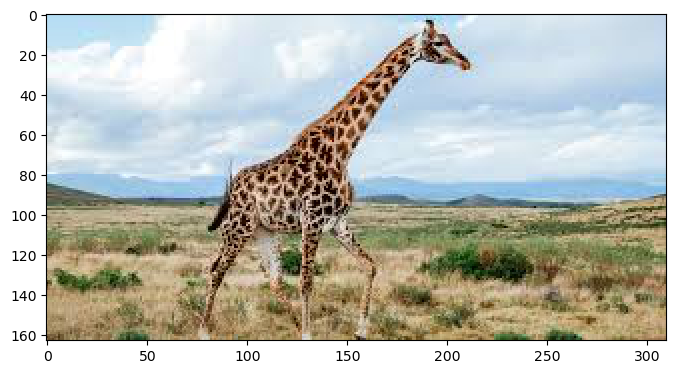

In [54]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt


img_paths = ["C:/Users/user/Downloads/animal.jpeg", 
             "C:/Users/user/Downloads/sandwich_eater.jpg", 
             "C:/Users/user/Downloads/Basil.jpg", 
             "C:/Users/user/Downloads/SashmoAndKelly.jpg", 
             "C:/Users/user/Downloads/cow.jpg", 
             "C:/Users/user/Downloads/billa.jpg",
             "C:/Users/user/Downloads/camel.jpg",
            "C:/Users/user/Downloads/sandwich1.jpg",
            "C:/Users/user/Downloads/sandwich2.jpg"]


def extract_features(filename, model):
        try:
            image = Image.open(filename)

        except:
            print("ERROR: Couldn't open image! Make sure the image path and extension is correct")
        image = image.resize((299,299))
        image = np.array(image)
        
        # for images that has 4 channels, we convert them into 3 channels
        if image.shape[2] == 4: 
            image = image[..., :3]
        image = np.expand_dims(image, axis=0)
        image = image/127.5
        image = image - 1.0
        feature = model.predict(image)
        return feature

def word_for_id(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None


def generate_desc(model, tokenizer, photo, max_length):
    in_text = 'start'
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], maxlen=max_length)
        pred = model.predict([photo,sequence], verbose=0)
        pred = np.argmax(pred)
        word = word_for_id(pred, tokenizer)
        
        if word is None:
            break
        in_text += ' ' + word
        
        if word == 'end':
            break
    return in_text


#max_length = 46

model = load_model('./models/model_0.h5')
xception_model = Xception(include_top=False, pooling="avg")

photo = extract_features(img_paths[0], xception_model)
img = Image.open(img_paths[0])
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)

1/1 [==============================] - 0s 439ms/step



start a woman sitting at a table with a sandwich end


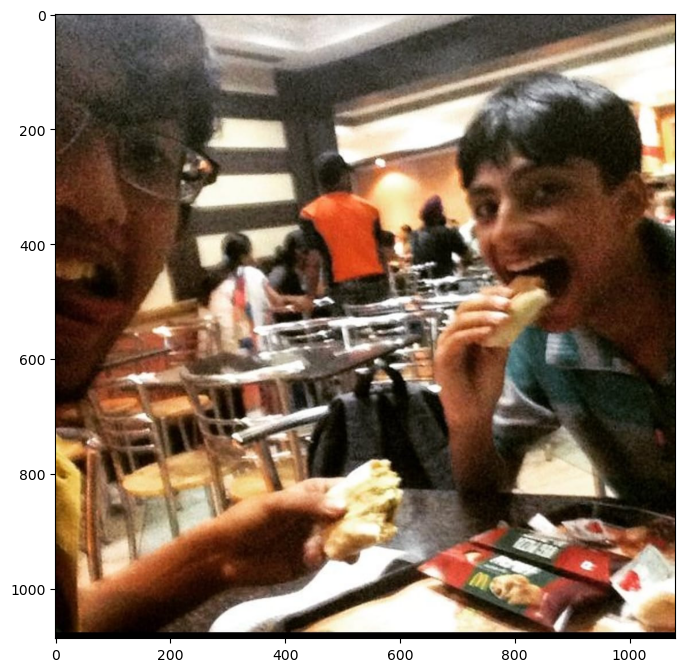

In [48]:
photo = extract_features(img_paths[1], xception_model)
img = Image.open(img_paths[1])
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)

1/1 [==============================] - 1s 693ms/step



start a man sitting at a table with a plate of food end


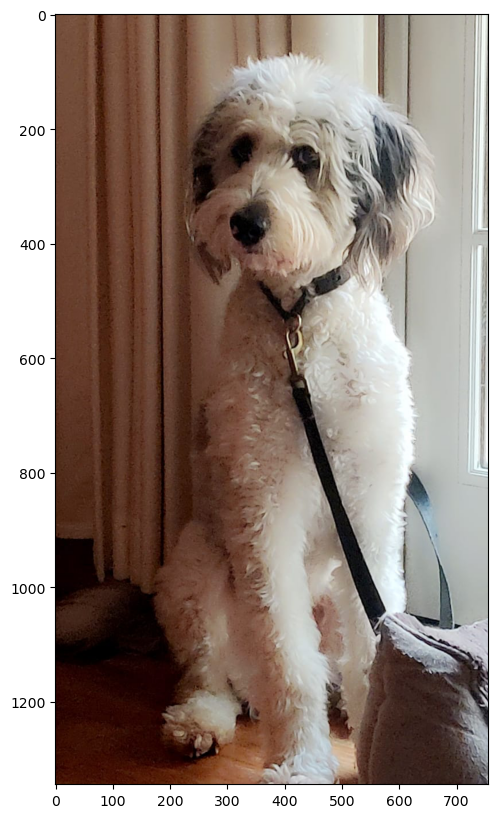

In [49]:
photo = extract_features(img_paths[2], xception_model)
img = Image.open(img_paths[2])
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)

1/1 [==============================] - 0s 283ms/step



start a man sitting on a bench with a sandwich end


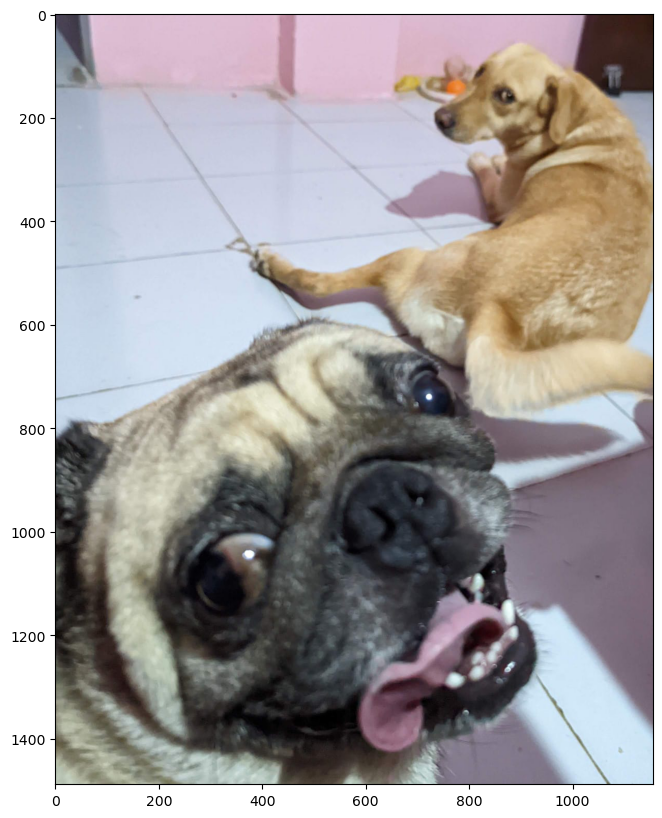

In [50]:
photo = extract_features(img_paths[3], xception_model)
img = Image.open(img_paths[3])
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)

1/1 [==============================] - 1s 502ms/step



start a man riding on the back of a large elephant end


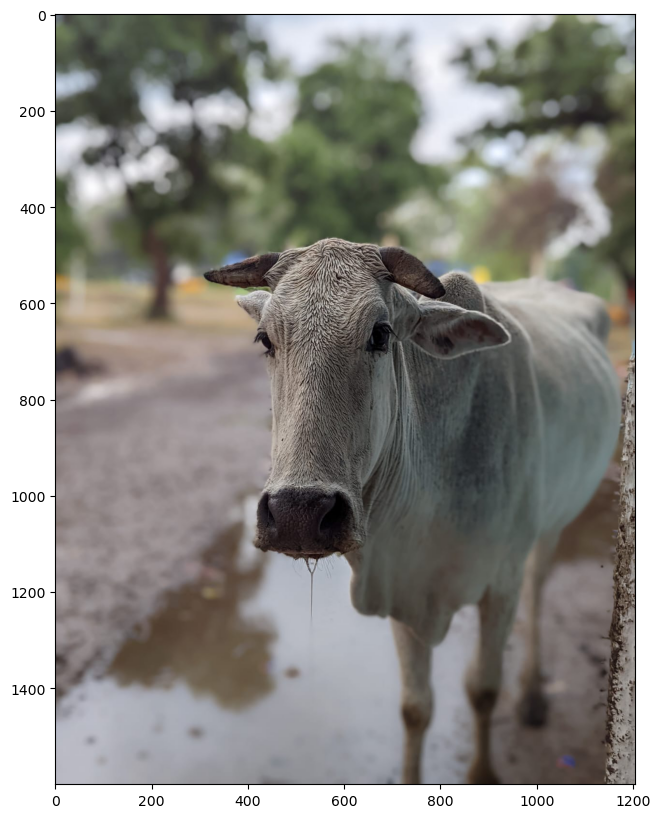

In [51]:
photo = extract_features(img_paths[4], xception_model)
img = Image.open(img_paths[4])
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)

1/1 [==============================] - 0s 241ms/step



start a man sitting on a bench with a sandwich end


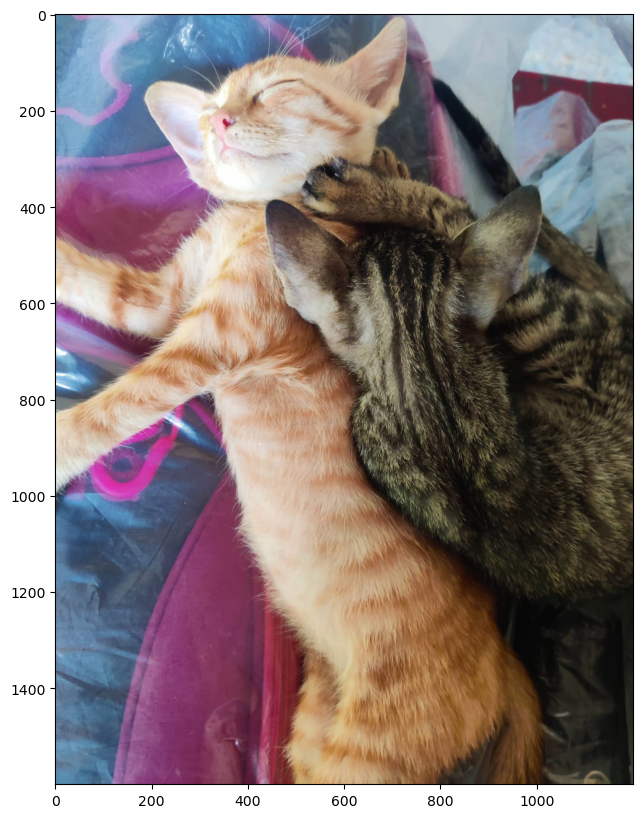

In [52]:
photo = extract_features(img_paths[5], xception_model)
img = Image.open(img_paths[5])
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)

1/1 [==============================] - 0s 254ms/step



start a group of people riding on the back of an elephant end


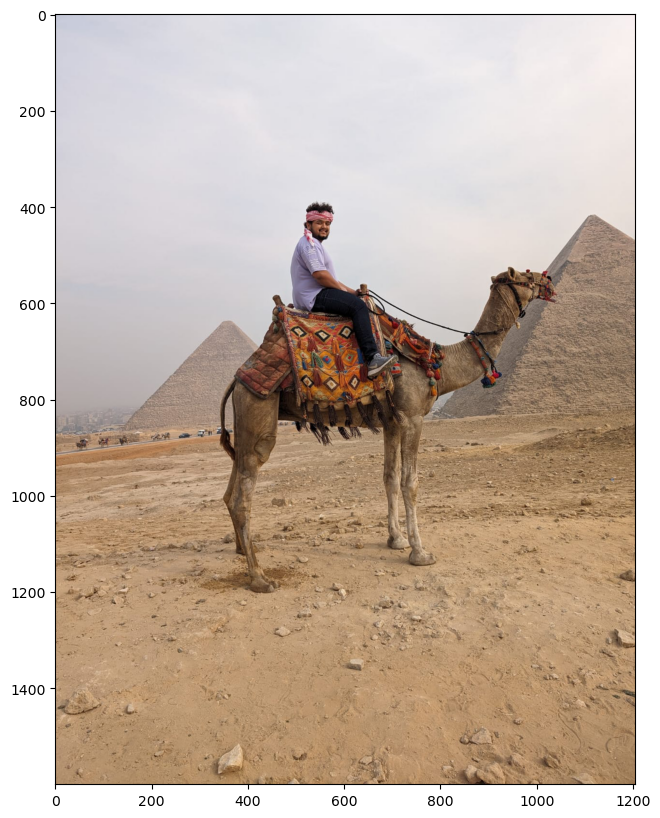

In [53]:
photo = extract_features(img_paths[6], xception_model)
img = Image.open(img_paths[6])
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)

1/1 [==============================] - 1s 970ms/step



start a woman sitting at a table with a plate of food end


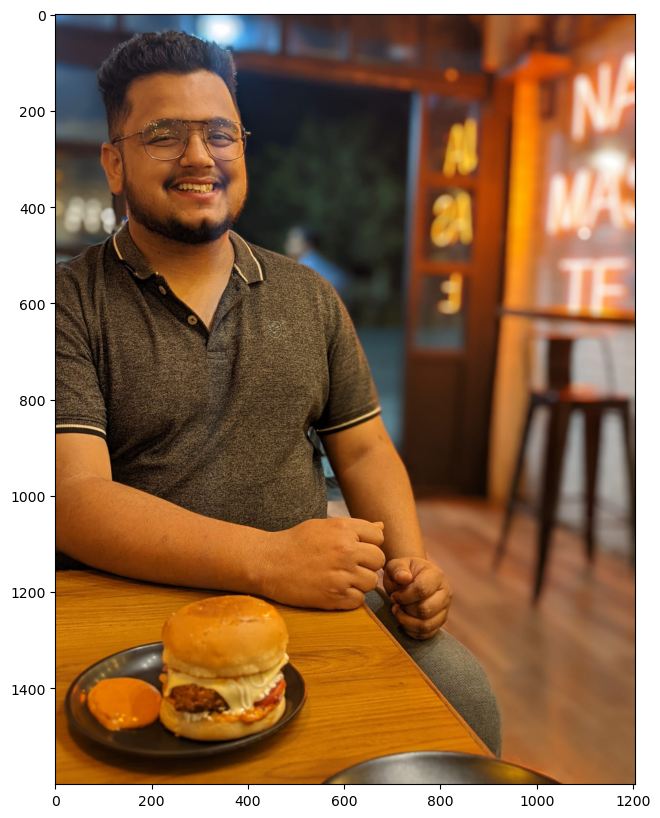

In [55]:
photo = extract_features(img_paths[7], xception_model)
img = Image.open(img_paths[7])
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)

1/1 [==============================] - 0s 204ms/step



start a plate with a sandwich and a cup of coffee end


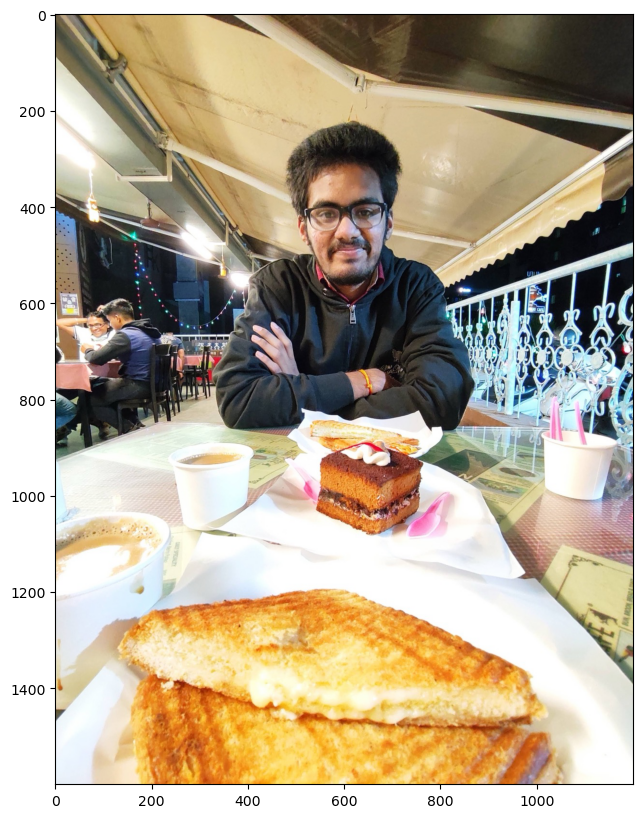

In [56]:
photo = extract_features(img_paths[8], xception_model)
img = Image.open(img_paths[8])
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)